# Advanced EDA on Review Dataset


This notebook contains an advanced exploratory data analysis (EDA) on the review dataset. The analysis is divided into two main sections: Univariate and Multivariate Analysis. We categorize columns into numerical and categorical types, then perform in-depth analysis for each category.

**Contents**:
1. **Data Preparation** - Load and inspect data, handle missing values.
2. **Univariate Analysis** - Separate numerical and categorical columns, perform analysis on each.
3. **Multivariate Analysis** - Explore relationships: numerical-numerical, numerical-categorical, and categorical-categorical.
4. **Advanced Visualizations** - Visualizations using KDE, violin plots, pair plots, and more for richer insights.


## 1. Load Dataset

In [1]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
data = pd.read_csv('review_dataset_v2.csv')

# Basic data overview
data.info()
data.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   name                 1456 non-null   object 
 1   review               1456 non-null   float64
 2   rating               1456 non-null   int64  
 3   company              1456 non-null   object 
 4   country              1456 non-null   object 
 5   date                 1456 non-null   object 
 6   topic                1456 non-null   object 
 7   content              1456 non-null   object 
 8   sentiment_score      1456 non-null   float64
 9   sentiment_magnitude  1456 non-null   float64
 10  entities             1456 non-null   object 
 11  review_class         1456 non-null   object 
 12  positive_reasons     1456 non-null   object 
 13  negative_reasons     1456 non-null   object 
 14  detected_language    1456 non-null   object 
 15  category             700 non-null    o

,name,review,rating,company,country,date,topic,content,sentiment_score,sentiment_magnitude,entities,review_class,positive_reasons,negative_reasons,detected_language,category,confidence
0,vladimiro mascaro,3.0,1,amazon,united kingdom,2024-10-01 18:25:37,4 months of total incopetence,since july until this month of all my orders 8...,-0.6,0.6,"orders, orders, thing, direct debit, headphone...",negative,no_positive,since july until this month of all my orders 8...,en,shopping',0.62
1,lucy loo,9.0,1,amazon,united kingdom,2024-10-01 09:57:32,driver stealing,as a family we order from amazon almost daily ...,-0.8,0.8,"amazon, family, change, one, nothing, packages...",negative,no_positive,as a family we order from amazon almost daily ...,en,NaN,NaN
2,da,21.0,5,amazon,united kingdom,2024-10-01 11:36:09,where is the negativity coming from,probably the only store that 1 delivers ontime...,0.1,0.1,"store, customers, prices, competitors, valuefo...",positive,probably the only store that 1 delivers ontime...,no_negative,en,NaN,NaN
3,vicki study,1.0,1,amazon,united kingdom,2024-10-01 15:36:33,absolutely appalling customer service,the customer service has been absolutely appal...,-0.7,0.7,"customer service, calls, ive, fault, issue, am...",negative,no_positive,the customer service has been absolutely appal...,en,NaN,NaN
4,jeffrey bruce,5.0,1,amazon,united kingdom,2024-10-01 17:09:02,amazon are quick enough to take payment,amazon are quick enough to take payment for or...,-0.7,0.7,"amazon, payment, orders, worst, claim, custome...",negative,no_positive,amazon are quick enough to take payment for or...,en,shopping',0.62


## 2. Data Preparation

In [2]:

# Convert 'date' column to datetime format
data['date'] = pd.to_datetime(data['date'], errors='coerce')
data['month_year'] = data['date'].dt.to_period('M')

# Check and handle missing values if necessary
missing_values = data.isnull().sum()
missing_values


name                     0
review                   0
rating                   0
company                  0
country                  0
date                     0
topic                    0
content                  0
sentiment_score          0
sentiment_magnitude      0
entities                 0
review_class             0
positive_reasons         0
negative_reasons         0
detected_language        0
category               756
confidence             775
month_year               0
dtype: int64

## 3. Univariate Analysis

### 3.1 Numerical Columns

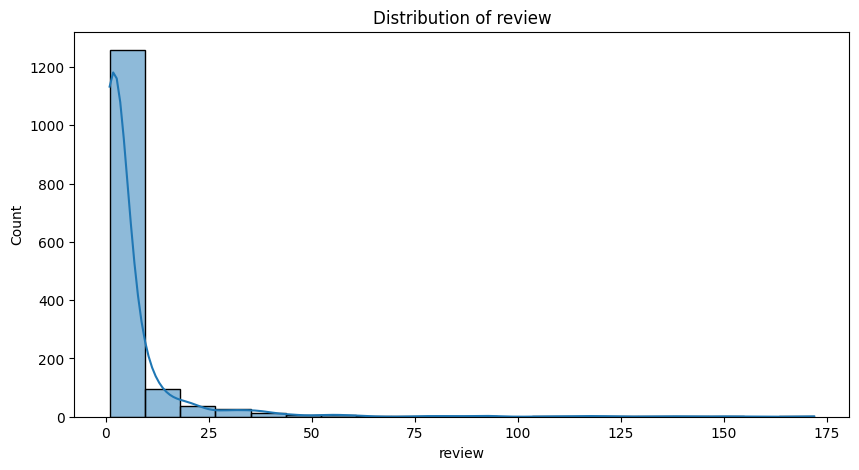

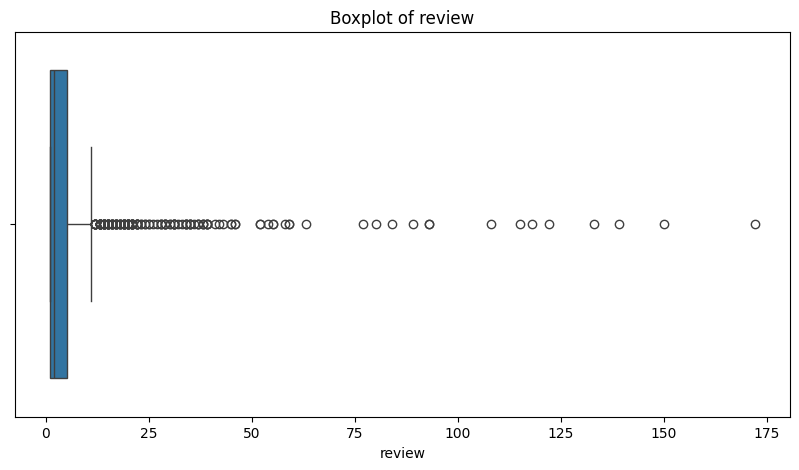

Statistics for review:
count    1456.000000
mean        5.976648
std        13.457001
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       172.000000
Name: review, dtype: float64




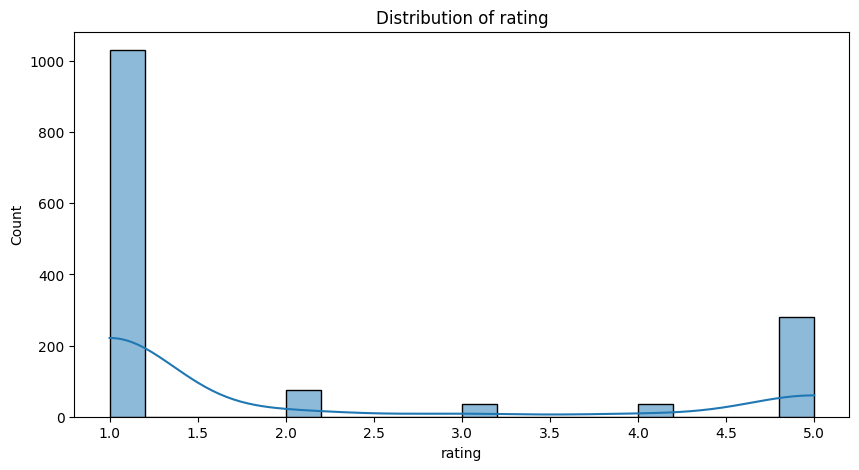

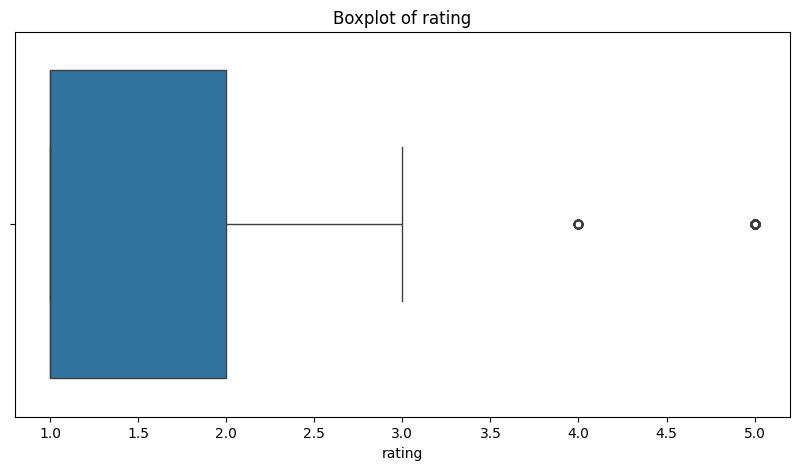

Statistics for rating:
count    1456.000000
mean        1.940247
std         1.597636
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         5.000000
Name: rating, dtype: float64




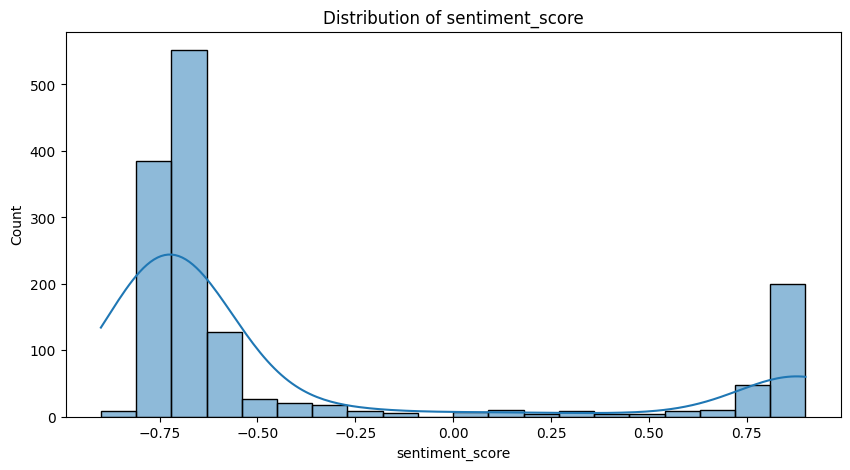

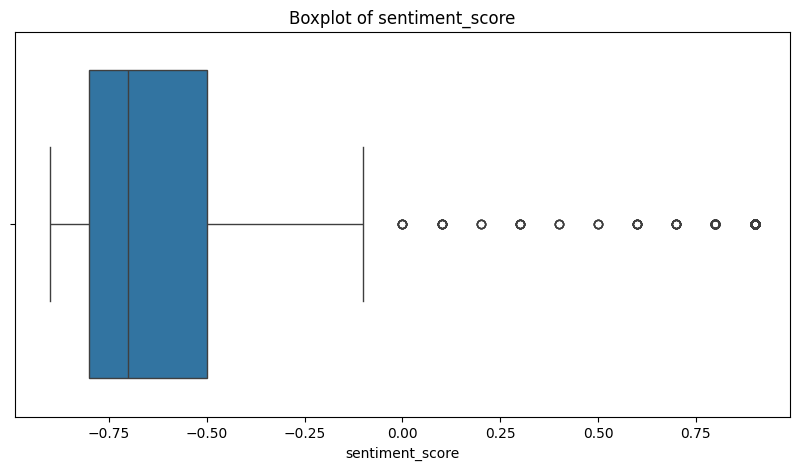

Statistics for sentiment_score:
count    1456.000000
mean       -0.392514
std         0.620247
min        -0.900000
25%        -0.800000
50%        -0.700000
75%        -0.500000
max         0.900000
Name: sentiment_score, dtype: float64




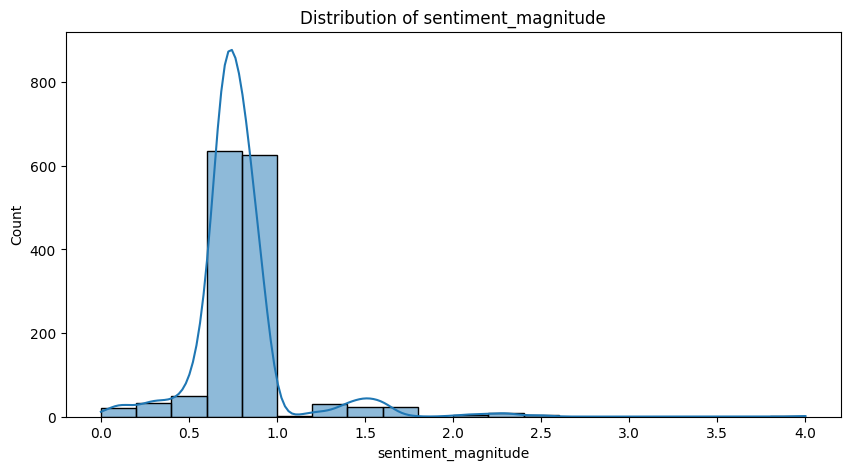

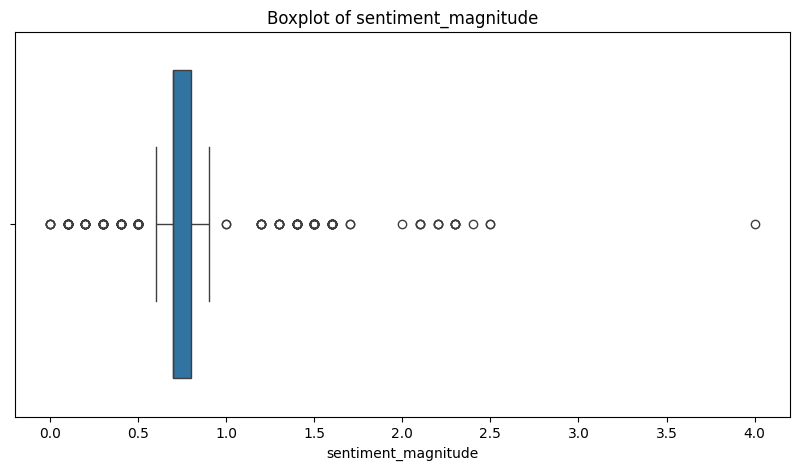

Statistics for sentiment_magnitude:
count    1456.000000
mean        0.780769
std         0.280502
min         0.000000
25%         0.700000
50%         0.700000
75%         0.800000
max         4.000000
Name: sentiment_magnitude, dtype: float64




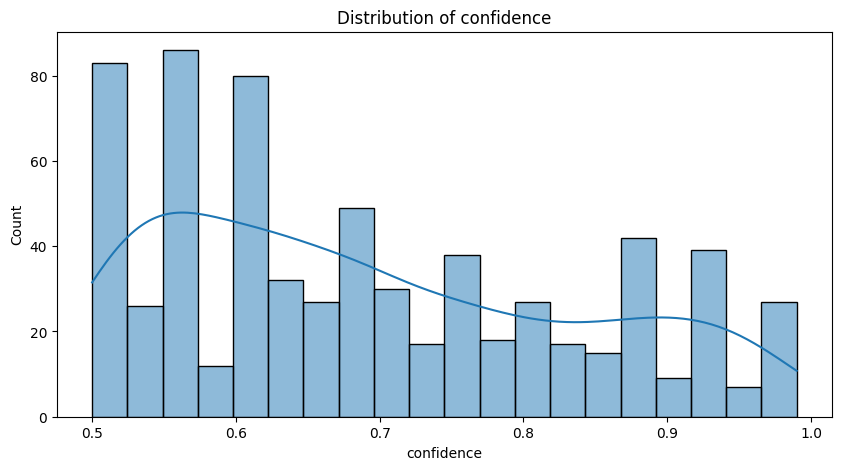

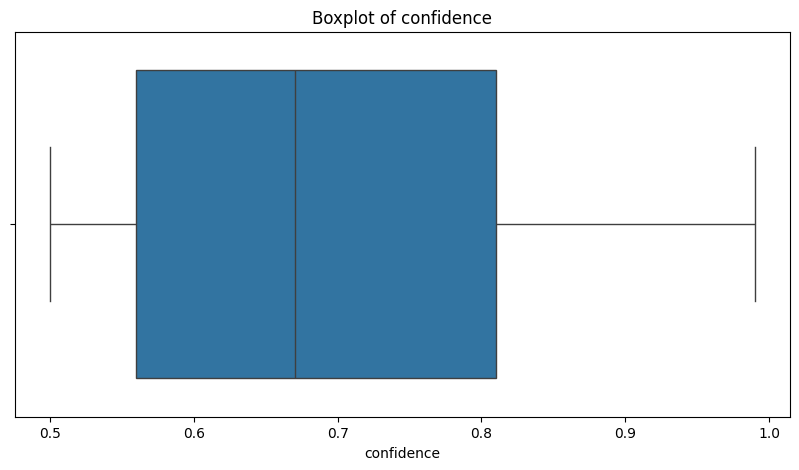

Statistics for confidence:
count    681.000000
mean       0.692291
std        0.142589
min        0.500000
25%        0.560000
50%        0.670000
75%        0.810000
max        0.990000
Name: confidence, dtype: float64




In [3]:

# Identify numerical columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Univariate analysis for each numerical column
for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(data[col], kde=True, bins=20)
    plt.title(f'Distribution of {col}')
    plt.show()

    # Boxplot for outlier detection
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=data[col])
    plt.title(f'Boxplot of {col}')
    plt.show()

    # Show basic statistics for each numerical column
    print(f"Statistics for {col}:")
    print(data[col].describe())
    print("\n")


### 3.2 Categorical Columns

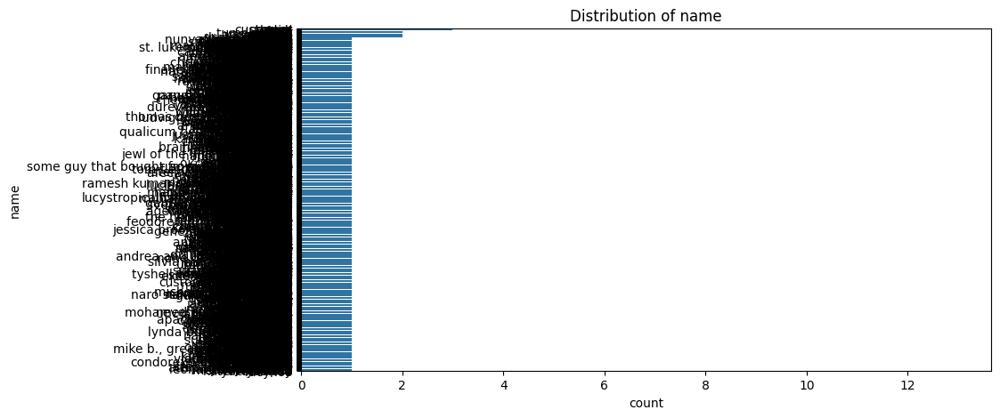

Value counts for name:
name
customer          13
george             5
daniel             3
alex               3
mark               3
                  ..
linda              1
karen bickford     1
de cee             1
yaclyn riley       1
lucy loo           1
Name: count, Length: 1397, dtype: int64




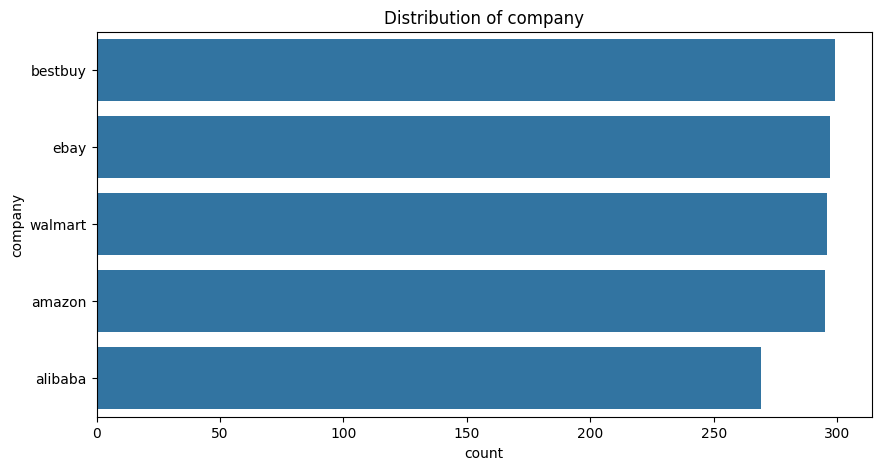

Value counts for company:
company
bestbuy    299
ebay       297
walmart    296
amazon     295
alibaba    269
Name: count, dtype: int64




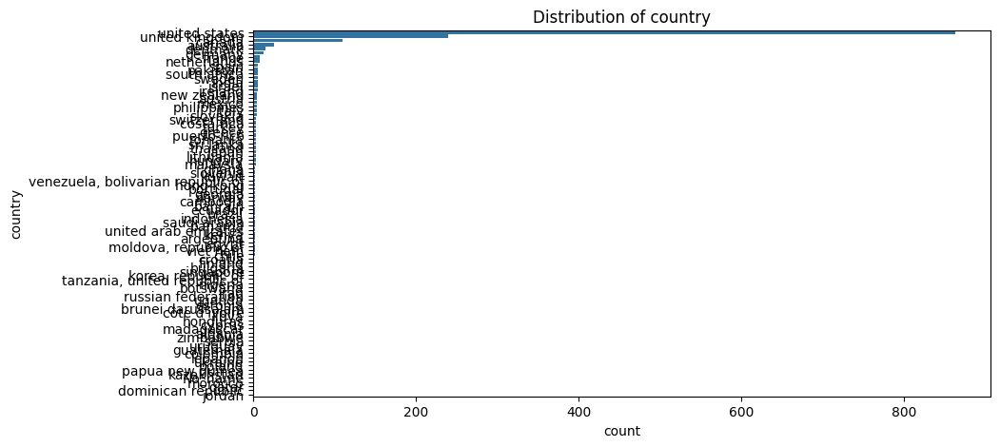

Value counts for country:
country
united states         863
united kingdom        239
canada                110
australia              25
denmark                15
                     ... 
No_name                 1
morocco                 1
qatar                   1
dominican republic      1
jordan                  1
Name: count, Length: 89, dtype: int64




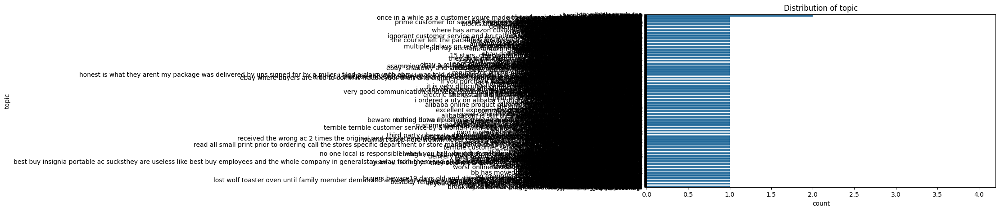

Value counts for topic:
topic
excellent service                           4
terrible experience                         3
great                                       3
terrible customer service                   3
great experience                            3
                                           ..
very poor delivery experience               1
change the name to best guess worst buy     1
they dont care the customers                1
the store on blanding in jacksonville       1
driver stealing                             1
Name: count, Length: 1429, dtype: int64




C:\Users\gaura\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


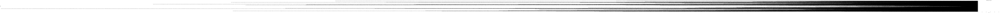

Value counts for content:
content
i have no issue with the products they sell but their chat support and service repair are terrible first i purchased an install they sent an mail with instructions it was a link back to the order details i called geek squad and they sent a link via chat to schedule that link took me to a webpage that then sent me to the app and opened a page to check on a scheduled appointment clicked on that and a blank page 2 hours in 2 chats just went nowhere got someone on the phone and after 30 minutes of i cant help or refund your money but hey let me transfer you 4 transfers later and the line went dead did they call back even though they have a callback number nonever buy an install from these people i would gladly pay 4x as much somewhere they will actually do the installlooks like i lost my money    1
the store on blanding in jacksonville florida is the worst store i have ever been in the employees are rude and stupid and lazy i bought a new apple watch and w

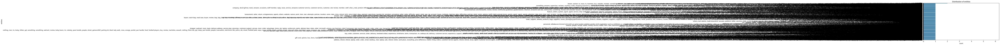

Value counts for entities:
entities
Not_entity                                                                                                                                                                  6
service                                                                                                                                                                     5
experience                                                                                                                                                                  4
delivery                                                                                                                                                                    3
customer service                                                                                                                                                            3
                                                                                              

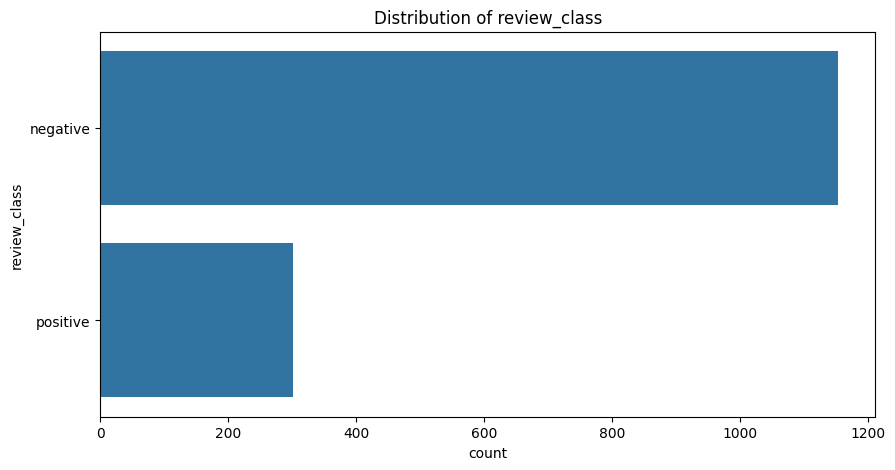

Value counts for review_class:
review_class
negative    1154
positive     302
Name: count, dtype: int64




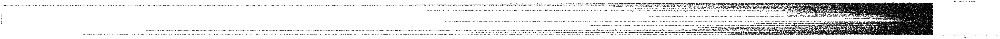

Value counts for positive_reasons:
positive_reasons
no_positive                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              1145
iv use amazon alot as i dont get out alot and find it very convenient for my needs and its delivered  i gave amazon  five stars                                                                                                                                                                                                                                                       

C:\Users\gaura\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


KeyboardInterrupt: 

In [4]:

# Identify categorical columns
categorical_cols = data.select_dtypes(include=['object']).columns

# Univariate analysis for each categorical column
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.show()

    # Print value counts for categorical columns
    print(f"Value counts for {col}:")
    print(data[col].value_counts())
    print("\n")


## 4. Multivariate Analysis

### 4.1 Numerical to Numerical Relationships

In [ ]:

# Correlation heatmap for numerical variables
numerical_data = data[numerical_cols]
plt.figure(figsize=(10, 8))
sns.heatmap(numerical_data.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Pairplot to visualize relationships between numerical variables
sns.pairplot(numerical_data, diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()


### 4.2 Numerical to Categorical Relationships

In [ ]:

# Boxplot of each numerical column by rating to explore differences
for num_col in numerical_cols:
    for cat_col in ['rating', 'review_class']:  # Assume rating and review_class are key categorical variables
        plt.figure(figsize=(10, 5))
        sns.boxplot(x=cat_col, y=num_col, data=data, palette='viridis')
        plt.title(f'{num_col} by {cat_col}')
        plt.show()


### 4.3 Categorical to Categorical Relationships

In [ ]:

# Categorical to categorical relationships (using heatmaps and countplots)
for col1 in categorical_cols:
    for col2 in categorical_cols:
        if col1 != col2:
            plt.figure(figsize=(10, 6))
            ct = pd.crosstab(data[col1], data[col2])
            sns.heatmap(ct, annot=True, fmt="d", cmap='YlGnBu')
            plt.title(f'{col1} vs {col2}')
            plt.show()
